In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import os
import tensorflow as tf
from keras.models import Sequential

from keras.layers import Dense, Dropout, Activation, Flatten,BatchNormalization, ZeroPadding2D,GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam

# from keras.utils import np_utils
from keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

2025-07-21 02:33:41.902379: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1753065222.084176      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1753065222.140393      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 21.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 68.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 52.8 MB/s eta 0:00:00:00:010:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 1.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.3 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 67.0 MB/s eta 0:00:00:00:0100:01
  Attempting unins

In [4]:

import cv2
from ultralytics import YOLO
from IPython.display import Image, display

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [16]:
root_dir = '/kaggle/input/vehicles/Vehicles_Detection.v8i.yolov8'

In [17]:
train_img = cv2.imread('/kaggle/input/vehicles/Vehicles_Detection.v8i.yolov8/train/images/frame_0002_jpg.rf.a929cd43bfa0953ace4ea9ea00fa9ba7.jpg')
test_img = cv2.imread('/kaggle/input/vehicles/Vehicles_Detection.v8i.yolov8/test/images/frame_0990_jpg.rf.a3223422e734a57442ee34a58d24d4b4.jpg')

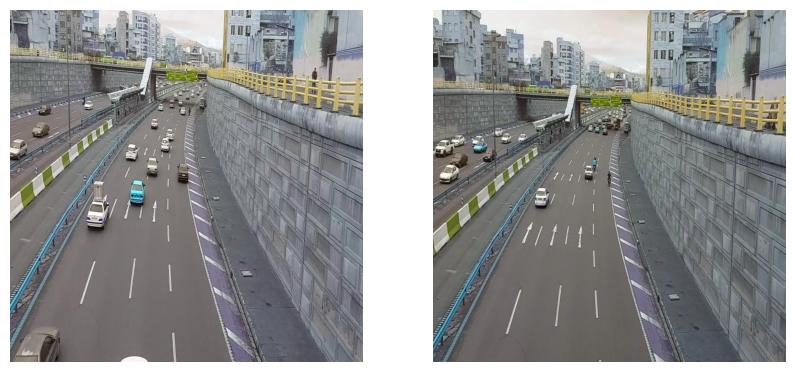

In [18]:
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)  
plt.imshow(train_img)
plt.axis('off')
plt.subplot(1, 2, 2)  
plt.imshow(test_img)
plt.axis('off')

plt.show()


In [8]:
model = YOLO('yolov8n.yaml')

In [19]:
model = YOLO('yolov8n.yaml')

results = model.train(data = os.path.join(root_dir, 'data.yaml'), epochs = 300)

Ultralytics 8.3.168 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/vehicles/Vehicles_Detection.v8i.yolov8/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=300, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=

train: Scanning /kaggle/input/vehicles/Vehicles_Detection.v8i.yolov8/train/labels... 102 images, 1 backgrounds, 0 corrupt: 100%|██████████| 102/102 [00:00<00:00, 836.65it/s]

WARNING ⚠️ train: Cache directory /kaggle/input/vehicles/Vehicles_Detection.v8i.yolov8/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.5±0.1 ms, read: 74.6±48.4 MB/s, size: 56.1 KB)


val: Scanning /kaggle/input/vehicles/Vehicles_Detection.v8i.yolov8/valid/labels... 28 images, 0 backgrounds, 0 corrupt: 100%|██████████| 28/28 [00:00<00:00, 755.31it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/vehicles/Vehicles_Detection.v8i.yolov8/valid is not writeable, cache not saved.


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 300 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/300      4.42G      4.779      5.617      4.515        282        640: 100%|██████████| 7/7 [00:01<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/300      4.45G      4.682      5.176        4.4         81        640: 100%|██████████| 7/7 [00:01<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/300      4.48G      4.614      4.828      4.224        242        640: 100%|██████████| 7/7 [00:01<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/300      4.49G      4.533      4.454      4.126        208        640: 100%|██████████| 7/7 [00:01<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


                   all         28        563          0          0          0          0

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/300      4.51G      4.121      4.024      3.925        147        640: 100%|██████████| 7/7 [00:01<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/300      4.52G      3.884      3.766      3.684        157        640: 100%|██████████| 7/7 [00:01<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/300      4.83G       3.56      3.374      3.472        133        640: 100%|██████████| 7/7 [00:01<00:00,  5.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/300      4.85G      3.481      3.257      3.262        202        640: 100%|██████████| 7/7 [00:01<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/300      4.87G      3.294      3.103      3.195         85        640: 100%|██████████| 7/7 [00:01<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/300      4.87G      3.244      3.031      2.989        110        640: 100%|██████████| 7/7 [00:01<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.11it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/300       4.9G      3.054      2.654      2.817        280        640: 100%|██████████| 7/7 [00:01<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/300      4.92G      2.918      2.595      2.599        136        640: 100%|██████████| 7/7 [00:01<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/300      4.93G      2.825      2.383      2.492        166        640: 100%|██████████| 7/7 [00:01<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/300      4.95G      2.742      2.317      2.472        119        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/300      4.96G      2.715      2.271      2.364        104        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/300      4.98G      2.606      2.163      2.265        149        640: 100%|██████████| 7/7 [00:01<00:00,  5.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/300         5G      2.529      2.112      2.168         91        640: 100%|██████████| 7/7 [00:01<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]

                   all         28        563          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/300      5.02G      2.541      2.023      2.123         79        640: 100%|██████████| 7/7 [00:01<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]

                   all         28        563   0.000106   0.000503   0.000303   6.05e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/300      5.03G      2.421      2.019      2.066        213        640: 100%|██████████| 7/7 [00:01<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]

                   all         28        563    0.00301     0.0271    0.00909    0.00241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/300      5.05G      2.471      1.982      1.974        135        640: 100%|██████████| 7/7 [00:01<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]

                   all         28        563      0.673     0.0261     0.0242    0.00658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/300      5.07G      2.384      2.016      1.936        133        640: 100%|██████████| 7/7 [00:01<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]

                   all         28        563      0.669     0.0221     0.0242    0.00688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/300      5.38G        2.3      1.894      1.917        136        640: 100%|██████████| 7/7 [00:01<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.94it/s]

                   all         28        563      0.675     0.0558     0.0533     0.0179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/300      5.39G      2.226      1.768      1.837        169        640: 100%|██████████| 7/7 [00:01<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]

                   all         28        563      0.715     0.0881     0.0823     0.0307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/300      5.42G      2.257      1.785      1.845        203        640: 100%|██████████| 7/7 [00:01<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]

                   all         28        563      0.605      0.126      0.107     0.0423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/300      5.44G      2.192      1.699       1.77        273        640: 100%|██████████| 7/7 [00:01<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.26it/s]

                   all         28        563      0.629      0.117      0.111     0.0427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/300      5.45G      2.219      1.714      1.768        208        640: 100%|██████████| 7/7 [00:01<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.23it/s]

                   all         28        563      0.605       0.17      0.144     0.0582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/300      5.46G      2.143      1.726      1.768        187        640: 100%|██████████| 7/7 [00:01<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]

                   all         28        563      0.623      0.179      0.164     0.0623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/300      5.49G      2.113      1.674      1.678        146        640: 100%|██████████| 7/7 [00:01<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.11it/s]

                   all         28        563       0.44      0.193      0.155     0.0559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/300       5.5G      2.112      1.649      1.645        176        640: 100%|██████████| 7/7 [00:01<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

                   all         28        563      0.447      0.196      0.162     0.0574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/300      5.52G      2.067      1.609      1.661        223        640: 100%|██████████| 7/7 [00:01<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

                   all         28        563       0.48      0.212      0.204     0.0877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/300      5.53G       2.13      1.608      1.635        124        640: 100%|██████████| 7/7 [00:01<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.31it/s]

                   all         28        563      0.477      0.218      0.186     0.0756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/300      5.55G      2.037      1.552      1.596        196        640: 100%|██████████| 7/7 [00:01<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]

                   all         28        563      0.507      0.226      0.226      0.101



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/300      5.57G      2.028      1.567      1.607        159        640: 100%|██████████| 7/7 [00:01<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

                   all         28        563      0.552      0.221      0.227     0.0995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/300      5.59G      2.007      1.561      1.571        167        640: 100%|██████████| 7/7 [00:01<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]

                   all         28        563      0.779      0.208      0.232      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/300       5.6G      1.996      1.559      1.547        219        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

                   all         28        563      0.594      0.235      0.217     0.0769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/300      5.62G      1.999      1.562      1.541        101        640: 100%|██████████| 7/7 [00:01<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

                   all         28        563      0.674      0.255      0.262      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/300      5.64G      1.894      1.438      1.491        160        640: 100%|██████████| 7/7 [00:01<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.07it/s]

                   all         28        563      0.604      0.238       0.26      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/300      5.66G      1.895      1.503      1.517        106        640: 100%|██████████| 7/7 [00:01<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]

                   all         28        563      0.818       0.24      0.261       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/300      5.67G      1.887      1.507      1.529        168        640: 100%|██████████| 7/7 [00:01<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]

                   all         28        563      0.593      0.241      0.287      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/300      5.69G       1.82      1.433      1.429        215        640: 100%|██████████| 7/7 [00:01<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

                   all         28        563      0.838      0.232       0.32      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/300      5.71G      1.854      1.373      1.473        104        640: 100%|██████████| 7/7 [00:01<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]

                   all         28        563      0.621      0.257      0.324      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/300      5.72G      1.855      1.377      1.464        112        640: 100%|██████████| 7/7 [00:01<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]

                   all         28        563      0.593      0.286      0.335      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/300      5.73G      1.937      1.428      1.457        175        640: 100%|██████████| 7/7 [00:01<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]

                   all         28        563      0.679      0.268      0.285      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/300      5.76G      1.828      1.435      1.466        123        640: 100%|██████████| 7/7 [00:01<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]

                   all         28        563      0.348      0.344       0.29      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/300      5.78G      1.765      1.359      1.407        195        640: 100%|██████████| 7/7 [00:01<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

                   all         28        563      0.475      0.308      0.317      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/300      5.79G      1.812      1.372      1.358        149        640: 100%|██████████| 7/7 [00:01<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]

                   all         28        563      0.536      0.283      0.335      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/300       5.8G      1.849       1.42      1.391        291        640: 100%|██████████| 7/7 [00:01<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]

                   all         28        563       0.49      0.269      0.314      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/300      5.83G      1.775      1.376      1.396        150        640: 100%|██████████| 7/7 [00:01<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

                   all         28        563      0.512      0.282      0.289       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/300      5.85G      1.733      1.355      1.376        152        640: 100%|██████████| 7/7 [00:01<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]

                   all         28        563      0.496      0.303      0.273      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/300      5.86G       1.79      1.352      1.415        148        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

                   all         28        563      0.606      0.285      0.337       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/300      5.87G      1.731       1.32      1.369         90        640: 100%|██████████| 7/7 [00:01<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

                   all         28        563      0.618      0.262      0.322      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/300       5.9G      1.776        1.3       1.32        148        640: 100%|██████████| 7/7 [00:01<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.29it/s]

                   all         28        563      0.541      0.308        0.3       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/300      6.23G        1.7      1.351      1.368        117        640: 100%|██████████| 7/7 [00:01<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.29it/s]

                   all         28        563      0.561      0.256      0.299      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/300      6.25G      1.749      1.284      1.346        134        640: 100%|██████████| 7/7 [00:01<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.65it/s]

                   all         28        563      0.789      0.254       0.31      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/300      6.26G      1.716       1.29       1.35        140        640: 100%|██████████| 7/7 [00:01<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.25it/s]

                   all         28        563      0.569      0.269      0.328      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/300      6.29G      1.763      1.345      1.349        181        640: 100%|██████████| 7/7 [00:01<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

                   all         28        563       0.42      0.389      0.345      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/300       6.3G      1.682      1.266       1.31        299        640: 100%|██████████| 7/7 [00:01<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]

                   all         28        563      0.469      0.348      0.371      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/300      6.32G      1.751      1.313        1.4        121        640: 100%|██████████| 7/7 [00:01<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.26it/s]

                   all         28        563      0.363      0.338      0.369      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/300      6.33G      1.679      1.226      1.327         87        640: 100%|██████████| 7/7 [00:01<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

                   all         28        563       0.37      0.382      0.326      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/300      6.35G      1.777      1.267      1.389        137        640: 100%|██████████| 7/7 [00:01<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


                   all         28        563      0.369      0.407      0.403      0.189

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/300      6.37G      1.706      1.271      1.343        113        640: 100%|██████████| 7/7 [00:01<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

                   all         28        563      0.426      0.369      0.453      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/300      6.39G      1.624      1.199      1.296        105        640: 100%|██████████| 7/7 [00:01<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]

                   all         28        563       0.58      0.384      0.397      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/300      6.39G      1.624       1.21      1.297        108        640: 100%|██████████| 7/7 [00:01<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

                   all         28        563      0.595       0.37      0.415      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/300      6.42G      1.618      1.162      1.276        171        640: 100%|██████████| 7/7 [00:01<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]

                   all         28        563      0.569      0.442      0.463      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/300      6.44G      1.614      1.174      1.274        186        640: 100%|██████████| 7/7 [00:01<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]

                   all         28        563      0.539      0.443      0.456      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/300      6.46G      1.614      1.173      1.265        171        640: 100%|██████████| 7/7 [00:01<00:00,  5.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

                   all         28        563      0.521       0.46      0.451      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/300      6.46G      1.602       1.19      1.262        177        640: 100%|██████████| 7/7 [00:01<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.38it/s]

                   all         28        563      0.452      0.462      0.459      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/300      6.49G      1.574      1.177      1.254        199        640: 100%|██████████| 7/7 [00:01<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

                   all         28        563      0.601      0.449      0.473      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/300      6.51G      1.544       1.16       1.24        126        640: 100%|██████████| 7/7 [00:01<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]

                   all         28        563      0.591       0.46      0.472      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/300      6.52G      1.585      1.177      1.268        213        640: 100%|██████████| 7/7 [00:01<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]

                   all         28        563      0.502      0.444       0.47      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/300      6.53G       1.62      1.165       1.26        367        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

                   all         28        563      0.799      0.456      0.527      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/300      6.56G      1.579      1.147      1.274        119        640: 100%|██████████| 7/7 [00:01<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

                   all         28        563      0.725       0.42      0.511      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/300      6.57G      1.516      1.136       1.22        264        640: 100%|██████████| 7/7 [00:01<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.22it/s]

                   all         28        563      0.741       0.43      0.523       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/300      6.59G      1.492      1.067      1.193        116        640: 100%|██████████| 7/7 [00:01<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

                   all         28        563      0.652       0.39      0.479       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/300       6.6G      1.532      1.092      1.225        172        640: 100%|██████████| 7/7 [00:01<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]

                   all         28        563      0.706      0.379      0.486       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/300      6.63G      1.446      1.117      1.239        144        640: 100%|██████████| 7/7 [00:01<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

                   all         28        563      0.646       0.41      0.486      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/300      6.64G      1.524      1.129      1.231        124        640: 100%|██████████| 7/7 [00:01<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]

                   all         28        563      0.578      0.443      0.505       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/300      6.66G      1.482      1.106      1.252        151        640: 100%|██████████| 7/7 [00:01<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.20it/s]

                   all         28        563      0.668       0.43       0.52      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/300      6.67G      1.496       1.06       1.23        171        640: 100%|██████████| 7/7 [00:01<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]

                   all         28        563      0.557      0.369      0.423      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/300       6.7G      1.444      1.062      1.216        186        640: 100%|██████████| 7/7 [00:01<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]

                   all         28        563      0.517      0.445      0.417      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/300      6.71G       1.54      1.095      1.204        260        640: 100%|██████████| 7/7 [00:01<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]

                   all         28        563      0.639      0.432      0.453      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/300      6.73G      1.473      1.084      1.224         79        640: 100%|██████████| 7/7 [00:01<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]

                   all         28        563      0.593      0.419      0.507      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/300      6.74G      1.477      1.087      1.192         62        640: 100%|██████████| 7/7 [00:01<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]

                   all         28        563      0.507      0.498      0.465      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/300      6.76G      1.474       1.05      1.193         88        640: 100%|██████████| 7/7 [00:01<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]

                   all         28        563      0.517      0.477      0.445      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/300      6.78G      1.416      1.037      1.189        105        640: 100%|██████████| 7/7 [00:01<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


                   all         28        563      0.506       0.56      0.476      0.251

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/300       6.8G       1.45      1.015      1.183        179        640: 100%|██████████| 7/7 [00:01<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

                   all         28        563       0.58      0.404      0.433      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/300       6.8G      1.431      1.041       1.17        150        640: 100%|██████████| 7/7 [00:01<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]

                   all         28        563      0.686      0.393      0.474      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/300      6.83G      1.435      1.049      1.184        177        640: 100%|██████████| 7/7 [00:01<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]

                   all         28        563      0.645       0.47      0.532      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/300      6.85G      1.417      1.012      1.168        163        640: 100%|██████████| 7/7 [00:01<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]

                   all         28        563      0.637      0.516      0.528      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/300      6.87G      1.454      1.025      1.163        242        640: 100%|██████████| 7/7 [00:01<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]

                   all         28        563      0.663       0.53      0.572      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/300      6.87G      1.439      1.043      1.191        103        640: 100%|██████████| 7/7 [00:01<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]

                   all         28        563       0.59      0.516      0.562      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/300       6.9G      1.419      1.033      1.165         76        640: 100%|██████████| 7/7 [00:01<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


                   all         28        563       0.63      0.493      0.538       0.28

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/300      6.92G      1.399     0.9807      1.174        151        640: 100%|██████████| 7/7 [00:01<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.10it/s]

                   all         28        563      0.581      0.501      0.516      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/300      6.93G      1.489      1.011      1.193        193        640: 100%|██████████| 7/7 [00:01<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]

                   all         28        563      0.504      0.482      0.464      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/300      6.94G      1.451      1.055      1.182        107        640: 100%|██████████| 7/7 [00:01<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]

                   all         28        563      0.529      0.372      0.415      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/300      6.97G      1.449      1.005       1.17        156        640: 100%|██████████| 7/7 [00:01<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]

                   all         28        563      0.622      0.389      0.449      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/300      6.98G      1.358      0.984      1.165        200        640: 100%|██████████| 7/7 [00:01<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]

                   all         28        563      0.522      0.555      0.496      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/300         7G      1.419      1.013      1.177        192        640: 100%|██████████| 7/7 [00:01<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

                   all         28        563      0.542       0.48      0.495      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/300      7.01G       1.37      1.012      1.173        161        640: 100%|██████████| 7/7 [00:01<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

                   all         28        563      0.558      0.498      0.529      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/300      7.04G      1.366      1.019      1.162        129        640: 100%|██████████| 7/7 [00:01<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]

                   all         28        563      0.514      0.495      0.526      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/300      7.05G      1.414       1.05      1.154        119        640: 100%|██████████| 7/7 [00:01<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

                   all         28        563      0.675      0.379      0.514      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/300      7.07G      1.365     0.9654       1.16        171        640: 100%|██████████| 7/7 [00:01<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]

                   all         28        563      0.492      0.496       0.49      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/300      7.08G      1.395     0.9979      1.159        232        640: 100%|██████████| 7/7 [00:01<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]

                   all         28        563      0.538      0.533      0.518      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/300      7.11G      1.406     0.9779      1.156        146        640: 100%|██████████| 7/7 [00:01<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]

                   all         28        563      0.543      0.442      0.505      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/300      7.12G        1.4      1.027      1.175        137        640: 100%|██████████| 7/7 [00:01<00:00,  6.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.14it/s]

                   all         28        563      0.665      0.459      0.526      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/300      7.14G      1.407     0.9987      1.157        126        640: 100%|██████████| 7/7 [00:01<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

                   all         28        563      0.543      0.527      0.524      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/300      7.15G      1.353      1.012      1.161        150        640: 100%|██████████| 7/7 [00:01<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]

                   all         28        563      0.611      0.448      0.482       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/300      7.17G      1.344     0.9407      1.121        237        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]

                   all         28        563       0.52      0.444      0.482      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/300      7.19G      1.348     0.9436      1.109        115        640: 100%|██████████| 7/7 [00:01<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]

                   all         28        563      0.512      0.438       0.48      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/300      7.21G      1.405     0.9878      1.122        196        640: 100%|██████████| 7/7 [00:01<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]

                   all         28        563      0.526      0.514      0.508      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/300      7.21G      1.364     0.9333      1.124        173        640: 100%|██████████| 7/7 [00:01<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.28it/s]

                   all         28        563      0.552      0.491      0.515      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/300      7.24G      1.336     0.9545      1.127        121        640: 100%|██████████| 7/7 [00:01<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]

                   all         28        563      0.585      0.509      0.523      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/300      7.26G      1.403     0.9855      1.142         84        640: 100%|██████████| 7/7 [00:01<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.08it/s]

                   all         28        563      0.651      0.453      0.506      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/300      7.28G      1.367     0.9524      1.118        195        640: 100%|██████████| 7/7 [00:01<00:00,  5.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]

                   all         28        563      0.763      0.411      0.544      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/300      7.28G      1.402     0.9269      1.151        171        640: 100%|██████████| 7/7 [00:01<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]

                   all         28        563      0.617      0.573      0.565      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/300      7.31G      1.353     0.9502      1.125        221        640: 100%|██████████| 7/7 [00:01<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]

                   all         28        563      0.735      0.476       0.55      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/300      7.33G      1.376     0.9099      1.113        240        640: 100%|██████████| 7/7 [00:01<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]

                   all         28        563      0.668      0.483      0.535      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/300      7.34G      1.326     0.9367      1.135        209        640: 100%|██████████| 7/7 [00:01<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


                   all         28        563      0.616      0.501      0.527      0.293

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/300      7.35G      1.314     0.9334      1.121        218        640: 100%|██████████| 7/7 [00:01<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

                   all         28        563      0.565       0.54      0.525      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/300      7.38G      1.347     0.9375      1.107        354        640: 100%|██████████| 7/7 [00:01<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


                   all         28        563      0.556      0.495      0.515      0.275

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/300      2.77G      1.327     0.9583      1.115        209        640: 100%|██████████| 7/7 [00:01<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

                   all         28        563      0.628       0.44      0.506      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/300      2.77G      1.316     0.9368      1.116        170        640: 100%|██████████| 7/7 [00:01<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]

                   all         28        563      0.579      0.517      0.525      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/300      2.77G      1.275     0.9328      1.091        130        640: 100%|██████████| 7/7 [00:01<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

                   all         28        563      0.633      0.466      0.529      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/300      2.77G      1.343     0.9615      1.154        104        640: 100%|██████████| 7/7 [00:01<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]

                   all         28        563      0.559      0.581      0.529      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/300      2.77G       1.35     0.9589      1.127        125        640: 100%|██████████| 7/7 [00:01<00:00,  6.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]

                   all         28        563      0.611      0.539      0.547      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/300      2.77G      1.319     0.9339      1.129        213        640: 100%|██████████| 7/7 [00:01<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

                   all         28        563      0.614      0.488      0.533      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/300      2.77G      1.312     0.9579      1.098        238        640: 100%|██████████| 7/7 [00:01<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.26it/s]

                   all         28        563       0.54      0.497       0.53      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/300      2.77G      1.274     0.8985      1.103        200        640: 100%|██████████| 7/7 [00:01<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

                   all         28        563      0.588      0.484      0.495      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/300      3.02G      1.298     0.8875      1.099        237        640: 100%|██████████| 7/7 [00:01<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

                   all         28        563      0.435      0.534      0.481      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/300      3.02G      1.307     0.9134      1.087        260        640: 100%|██████████| 7/7 [00:01<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

                   all         28        563      0.595      0.467      0.538      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/300      3.02G      1.288     0.9062      1.117         92        640: 100%|██████████| 7/7 [00:01<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

                   all         28        563      0.525      0.537      0.548      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/300      3.02G      1.259     0.8507      1.107        171        640: 100%|██████████| 7/7 [00:01<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]

                   all         28        563      0.622      0.572      0.581      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/300      3.02G      1.308      0.883      1.087        121        640: 100%|██████████| 7/7 [00:01<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]

                   all         28        563      0.629      0.603      0.555      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/300      3.29G       1.26     0.8771      1.092        111        640: 100%|██████████| 7/7 [00:01<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

                   all         28        563       0.65      0.545      0.547      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/300       3.3G      1.289      0.907      1.123        221        640: 100%|██████████| 7/7 [00:01<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.38it/s]

                   all         28        563      0.644      0.538      0.538      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/300      3.32G      1.274     0.9222      1.099        236        640: 100%|██████████| 7/7 [00:01<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]

                   all         28        563      0.586      0.604      0.577      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/300      3.34G      1.289     0.9298      1.099        103        640: 100%|██████████| 7/7 [00:01<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

                   all         28        563      0.731      0.487      0.547      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/300      3.36G      1.301     0.8976      1.106        189        640: 100%|██████████| 7/7 [00:01<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]

                   all         28        563      0.791       0.44      0.559      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/300      3.37G      1.288     0.9068      1.138        140        640: 100%|██████████| 7/7 [00:01<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]

                   all         28        563      0.647      0.461      0.551      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/300      3.39G      1.281     0.9004      1.095        154        640: 100%|██████████| 7/7 [00:01<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

                   all         28        563       0.73      0.476      0.554      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/300      3.41G      1.281     0.9151      1.134         90        640: 100%|██████████| 7/7 [00:01<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]

                   all         28        563      0.752      0.476      0.563      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/300      3.43G      1.276     0.8937      1.096        102        640: 100%|██████████| 7/7 [00:01<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.23it/s]

                   all         28        563      0.662      0.517      0.568      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/300      3.43G      1.289     0.8893      1.094         91        640: 100%|██████████| 7/7 [00:01<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.05it/s]

                   all         28        563      0.568      0.656      0.531       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/300      3.46G      1.278      0.861      1.091        203        640: 100%|██████████| 7/7 [00:01<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.33it/s]

                   all         28        563      0.591      0.559      0.519      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/300      3.48G      1.288     0.8654      1.068        207        640: 100%|██████████| 7/7 [00:01<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]

                   all         28        563      0.612      0.552      0.525      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/300      3.49G      1.233     0.8452      1.095        151        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]

                   all         28        563      0.573      0.604      0.532        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/300      3.77G      1.254     0.8524      1.087        170        640: 100%|██████████| 7/7 [00:01<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

                   all         28        563      0.577      0.566      0.548      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/300      3.79G      1.239     0.8336      1.058        112        640: 100%|██████████| 7/7 [00:01<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]

                   all         28        563      0.558      0.567      0.558      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/300      3.81G      1.252      0.875      1.088         92        640: 100%|██████████| 7/7 [00:01<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

                   all         28        563      0.592      0.553      0.558       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/300      3.83G      1.262     0.8401      1.102        156        640: 100%|██████████| 7/7 [00:01<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.01it/s]

                   all         28        563      0.712      0.464      0.544      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/300      3.84G      1.244      0.837       1.07        161        640: 100%|██████████| 7/7 [00:01<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]

                   all         28        563      0.549      0.549      0.554      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/300      3.86G      1.257     0.8551      1.087        201        640: 100%|██████████| 7/7 [00:01<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]

                   all         28        563      0.616       0.55      0.576      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/300      3.88G      1.193     0.8645       1.08         90        640: 100%|██████████| 7/7 [00:01<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]

                   all         28        563      0.553      0.638      0.589      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/300       3.9G      1.246     0.8475      1.087        214        640: 100%|██████████| 7/7 [00:01<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.25it/s]

                   all         28        563      0.672      0.586      0.603      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/300       3.9G       1.22      0.828      1.065        178        640: 100%|██████████| 7/7 [00:01<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

                   all         28        563      0.709      0.467      0.582      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/300      3.93G      1.253     0.8788      1.079        155        640: 100%|██████████| 7/7 [00:01<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]

                   all         28        563       0.71      0.466      0.558      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/300      3.95G      1.226     0.8632      1.071        220        640: 100%|██████████| 7/7 [00:01<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.90it/s]

                   all         28        563      0.586      0.538      0.566      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/300      3.96G      1.259     0.8718      1.073        127        640: 100%|██████████| 7/7 [00:01<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

                   all         28        563      0.583      0.526       0.55      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/300      3.97G      1.242     0.8561      1.081        150        640: 100%|██████████| 7/7 [00:01<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

                   all         28        563      0.624      0.574      0.584      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/300         4G      1.215     0.8444      1.063         97        640: 100%|██████████| 7/7 [00:01<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

                   all         28        563      0.606      0.583      0.583      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/300      4.02G      1.263      0.844      1.069        232        640: 100%|██████████| 7/7 [00:01<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

                   all         28        563      0.634      0.524       0.57      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/300      4.03G      1.289     0.8536      1.086        133        640: 100%|██████████| 7/7 [00:01<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

                   all         28        563       0.66       0.56      0.589      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/300      4.04G      1.228     0.8243      1.076        140        640: 100%|██████████| 7/7 [00:01<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]

                   all         28        563      0.687      0.522      0.584      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/300      4.07G      1.258     0.8588      1.079        167        640: 100%|██████████| 7/7 [00:01<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]

                   all         28        563      0.662      0.479      0.563      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/300      4.08G      1.224     0.8265      1.042        206        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.33it/s]

                   all         28        563      0.634      0.489      0.551      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/300       4.4G      1.236     0.8176       1.06        159        640: 100%|██████████| 7/7 [00:01<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]

                   all         28        563      0.634      0.504      0.558      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/300      4.41G      1.175     0.8551      1.076        160        640: 100%|██████████| 7/7 [00:01<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


                   all         28        563      0.779      0.491       0.59      0.341

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/300      4.43G      1.216     0.8165      1.048        170        640: 100%|██████████| 7/7 [00:01<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

                   all         28        563      0.678      0.589      0.608      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/300      4.45G      1.157     0.8091      1.045        162        640: 100%|██████████| 7/7 [00:01<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.09it/s]

                   all         28        563      0.626      0.642      0.593      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/300      4.47G      1.208     0.7814      1.065        256        640: 100%|██████████| 7/7 [00:01<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]

                   all         28        563      0.597      0.633      0.617      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/300      4.48G      1.189     0.7953      1.062        123        640: 100%|██████████| 7/7 [00:01<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]

                   all         28        563      0.599      0.664      0.589      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/300       4.5G      1.252     0.9131      1.097         96        640: 100%|██████████| 7/7 [00:01<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]

                   all         28        563      0.616       0.59      0.571      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/300      4.52G      1.189     0.8372      1.056        128        640: 100%|██████████| 7/7 [00:01<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]

                   all         28        563      0.638      0.588      0.575       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/300      4.54G      1.179     0.8419      1.082         58        640: 100%|██████████| 7/7 [00:01<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

                   all         28        563      0.607      0.662      0.591       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/300      4.54G      1.222     0.8339      1.061        141        640: 100%|██████████| 7/7 [00:01<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

                   all         28        563      0.687      0.549      0.588      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/300      4.57G      1.215     0.8337      1.062        202        640: 100%|██████████| 7/7 [00:01<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


                   all         28        563      0.603      0.597      0.575      0.322

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/300      4.59G      1.193     0.8346      1.079        194        640: 100%|██████████| 7/7 [00:01<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

                   all         28        563      0.574      0.583      0.575      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/300      4.91G      1.204     0.8429      1.068         97        640: 100%|██████████| 7/7 [00:01<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]

                   all         28        563      0.599      0.662      0.593      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/300      4.92G       1.25     0.8475      1.074        184        640: 100%|██████████| 7/7 [00:01<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

                   all         28        563      0.667      0.553      0.568      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/300      4.94G      1.123     0.7904      1.057         68        640: 100%|██████████| 7/7 [00:01<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


                   all         28        563      0.583      0.597      0.555      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/300      4.96G       1.21     0.8054      1.047        293        640: 100%|██████████| 7/7 [00:01<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]

                   all         28        563      0.573      0.591      0.553      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/300      4.97G      1.204     0.7841      1.019        173        640: 100%|██████████| 7/7 [00:01<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

                   all         28        563      0.622       0.62      0.601      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/300      4.98G      1.235     0.8156      1.074        180        640: 100%|██████████| 7/7 [00:01<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]

                   all         28        563      0.644      0.589      0.611       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/300      5.01G      1.212     0.7808      1.047        304        640: 100%|██████████| 7/7 [00:01<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]

                   all         28        563      0.761      0.538      0.632       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/300      5.03G      1.211     0.8003      1.055        135        640: 100%|██████████| 7/7 [00:01<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]

                   all         28        563      0.753      0.533      0.636       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/300      5.04G      1.199     0.7953      1.047        289        640: 100%|██████████| 7/7 [00:01<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]

                   all         28        563      0.722      0.537      0.626       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/300      5.05G      1.219     0.8061      1.066         85        640: 100%|██████████| 7/7 [00:01<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]

                   all         28        563      0.751      0.497      0.608      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/300      5.08G      1.193     0.7684      1.031        192        640: 100%|██████████| 7/7 [00:01<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

                   all         28        563      0.597      0.604      0.598      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/300       5.1G      1.209     0.8156       1.06        165        640: 100%|██████████| 7/7 [00:01<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]

                   all         28        563      0.634      0.548      0.586      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/300      5.11G      1.251     0.8204      1.072        175        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.15it/s]

                   all         28        563      0.592      0.644      0.579      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/300      5.12G      1.156     0.8217       1.06         70        640: 100%|██████████| 7/7 [00:01<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.12it/s]

                   all         28        563      0.599      0.624      0.608      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/300      5.15G       1.19     0.7585      1.036        213        640: 100%|██████████| 7/7 [00:01<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


                   all         28        563      0.629      0.539      0.583      0.342

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/300      5.16G      1.182     0.7919       1.03        209        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.29it/s]

                   all         28        563      0.673      0.503      0.578      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/300      5.18G      1.215     0.8214      1.048        146        640: 100%|██████████| 7/7 [00:01<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

                   all         28        563       0.64      0.554      0.557       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/300      5.19G      1.167     0.7804      1.063        102        640: 100%|██████████| 7/7 [00:01<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]

                   all         28        563      0.626      0.576      0.581      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/300      5.21G      1.179     0.7819      1.039        247        640: 100%|██████████| 7/7 [00:01<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]

                   all         28        563      0.568      0.627      0.585      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/300      5.23G      1.148     0.7723      1.066        172        640: 100%|██████████| 7/7 [00:01<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]

                   all         28        563      0.554      0.628        0.6      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/300      5.25G      1.184     0.7871       1.05        157        640: 100%|██████████| 7/7 [00:01<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]

                   all         28        563      0.658      0.534      0.607      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/300      5.26G      1.197     0.7975      1.045        212        640: 100%|██████████| 7/7 [00:01<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

                   all         28        563      0.747      0.513      0.609      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/300      5.28G      1.218      0.779      1.066        167        640: 100%|██████████| 7/7 [00:01<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

                   all         28        563      0.621       0.59      0.614      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    201/300       5.3G      1.163      0.804      1.045        132        640: 100%|██████████| 7/7 [00:01<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.29it/s]

                   all         28        563      0.617      0.609      0.615      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    202/300      5.32G       1.19     0.7683      1.027        157        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

                   all         28        563      0.639      0.658      0.604       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    203/300      5.33G      1.181     0.7745      1.052        111        640: 100%|██████████| 7/7 [00:01<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

                   all         28        563      0.644       0.62      0.601      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    204/300      5.35G      1.191     0.7857      1.038        125        640: 100%|██████████| 7/7 [00:01<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]

                   all         28        563      0.666      0.651      0.618      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    205/300      5.37G      1.166     0.7673      1.048        195        640: 100%|██████████| 7/7 [00:01<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]

                   all         28        563      0.702      0.627      0.634      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    206/300      5.38G      1.179     0.7465      1.028        128        640: 100%|██████████| 7/7 [00:01<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]

                   all         28        563      0.685      0.604      0.622      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    207/300      5.39G      1.153     0.7899      1.039        169        640: 100%|██████████| 7/7 [00:01<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


                   all         28        563      0.673      0.612      0.627      0.368

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    208/300      5.42G      1.169     0.7575       1.04        177        640: 100%|██████████| 7/7 [00:01<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]

                   all         28        563      0.655      0.666      0.633      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    209/300      5.44G      1.153     0.7683      1.035        210        640: 100%|██████████| 7/7 [00:01<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]

                   all         28        563      0.684      0.645       0.64      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    210/300      5.45G      1.138     0.7821      1.034        117        640: 100%|██████████| 7/7 [00:01<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]

                   all         28        563      0.637      0.598      0.614      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    211/300      5.46G       1.14     0.7743       1.03        121        640: 100%|██████████| 7/7 [00:01<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

                   all         28        563       0.65       0.56      0.604      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    212/300      5.49G      1.199     0.8275      1.049         97        640: 100%|██████████| 7/7 [00:01<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

                   all         28        563      0.685      0.604      0.622      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    213/300      5.82G      1.162     0.7619      1.032        225        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


                   all         28        563      0.681      0.619      0.609      0.368

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    214/300      5.84G       1.17      0.788      1.045        223        640: 100%|██████████| 7/7 [00:01<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

                   all         28        563      0.638       0.62      0.607      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    215/300      5.85G      1.175     0.7469      1.013        215        640: 100%|██████████| 7/7 [00:01<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

                   all         28        563      0.637      0.626      0.601      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    216/300      5.88G      1.151     0.7586      1.029        125        640: 100%|██████████| 7/7 [00:01<00:00,  6.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]

                   all         28        563      0.641      0.616      0.591      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    217/300      5.89G      1.151     0.7822      1.025        133        640: 100%|██████████| 7/7 [00:01<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


                   all         28        563       0.66      0.616      0.592      0.352

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    218/300      5.91G      1.153     0.7499      1.021        156        640: 100%|██████████| 7/7 [00:01<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

                   all         28        563      0.683      0.625      0.617      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    219/300      5.92G      1.125     0.7335       1.02        248        640: 100%|██████████| 7/7 [00:01<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

                   all         28        563      0.675      0.669      0.631      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    220/300      5.94G      1.123     0.7525      1.025        126        640: 100%|██████████| 7/7 [00:01<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]

                   all         28        563      0.665      0.619      0.618      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    221/300      5.96G      1.142     0.7569       1.03        103        640: 100%|██████████| 7/7 [00:01<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]

                   all         28        563      0.685       0.63      0.627      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    222/300      5.98G      1.119     0.7507      1.025        191        640: 100%|██████████| 7/7 [00:01<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]

                   all         28        563      0.661      0.657      0.633      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    223/300      5.98G      1.131     0.7892       1.04        125        640: 100%|██████████| 7/7 [00:01<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.30it/s]

                   all         28        563      0.668      0.633      0.623      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    224/300      6.01G      1.118     0.7454      1.014        155        640: 100%|██████████| 7/7 [00:01<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


                   all         28        563      0.691      0.572      0.636      0.371

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    225/300      6.03G      1.189     0.7691      1.046        197        640: 100%|██████████| 7/7 [00:01<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


                   all         28        563       0.66      0.587      0.636      0.377

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    226/300      6.04G      1.148     0.7202       1.03        292        640: 100%|██████████| 7/7 [00:01<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]

                   all         28        563      0.655      0.642      0.627      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    227/300      6.05G      1.144     0.7597      1.017        150        640: 100%|██████████| 7/7 [00:01<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]

                   all         28        563      0.637      0.666      0.611       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    228/300      6.08G      1.156     0.8158      1.033        216        640: 100%|██████████| 7/7 [00:01<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

                   all         28        563       0.69       0.59       0.62      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    229/300       6.1G      1.133     0.7476      1.031        119        640: 100%|██████████| 7/7 [00:01<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.26it/s]

                   all         28        563      0.698      0.588      0.638      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    230/300      6.11G      1.176      0.757      1.023        185        640: 100%|██████████| 7/7 [00:01<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.14it/s]

                   all         28        563      0.711      0.585      0.657      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    231/300      6.12G      1.135     0.7386      1.019        126        640: 100%|██████████| 7/7 [00:01<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]

                   all         28        563      0.663      0.615      0.647       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    232/300      6.15G      1.162     0.7621      1.038        113        640: 100%|██████████| 7/7 [00:01<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

                   all         28        563       0.68      0.611      0.648       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    233/300      6.16G      1.142     0.7615      1.026        193        640: 100%|██████████| 7/7 [00:01<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]

                   all         28        563      0.693      0.601       0.65      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    234/300      6.18G       1.14     0.7539      1.021        210        640: 100%|██████████| 7/7 [00:01<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

                   all         28        563      0.689      0.596      0.644      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    235/300      6.19G       1.14     0.7479      1.022        274        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]

                   all         28        563      0.697      0.593       0.64      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    236/300      6.22G      1.124     0.7503      1.028        133        640: 100%|██████████| 7/7 [00:01<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]

                   all         28        563      0.719      0.602      0.644      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    237/300      6.23G      1.152     0.7516      1.019        196        640: 100%|██████████| 7/7 [00:01<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

                   all         28        563      0.689      0.641       0.63       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    238/300      6.25G      1.105     0.7312      1.013        217        640: 100%|██████████| 7/7 [00:01<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]

                   all         28        563      0.665      0.629      0.619      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    239/300      6.26G      1.104      0.711      1.036        117        640: 100%|██████████| 7/7 [00:01<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

                   all         28        563      0.696      0.648      0.612      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    240/300      6.29G      1.159     0.7759      1.028         84        640: 100%|██████████| 7/7 [00:01<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

                   all         28        563      0.732      0.609      0.637      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    241/300       6.3G       1.12     0.7269      1.019        143        640: 100%|██████████| 7/7 [00:01<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

                   all         28        563      0.723      0.608       0.64      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    242/300      6.32G      1.123     0.7279     0.9961        255        640: 100%|██████████| 7/7 [00:01<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

                   all         28        563      0.702      0.583      0.632      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    243/300      6.33G      1.119     0.7738      1.044        135        640: 100%|██████████| 7/7 [00:01<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

                   all         28        563      0.711      0.557      0.607       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    244/300      6.35G       1.12     0.7503      1.024        150        640: 100%|██████████| 7/7 [00:01<00:00,  6.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]

                   all         28        563      0.687      0.589      0.629      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    245/300      6.37G      1.153     0.7497      1.013        100        640: 100%|██████████| 7/7 [00:01<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]

                   all         28        563      0.678      0.612      0.644      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    246/300      6.39G      1.096     0.7027      1.025        129        640: 100%|██████████| 7/7 [00:01<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.24it/s]

                   all         28        563      0.712       0.59      0.651      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    247/300      6.39G      1.142     0.7611      1.034        157        640: 100%|██████████| 7/7 [00:01<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]

                   all         28        563      0.674      0.598      0.641      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    248/300      6.42G      1.091      0.718      1.004        157        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]

                   all         28        563      0.665      0.628      0.642      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    249/300      6.44G      1.092     0.7246      1.007        168        640: 100%|██████████| 7/7 [00:01<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         28        563      0.657      0.624      0.622      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    250/300      6.46G      1.124     0.7247      1.002        127        640: 100%|██████████| 7/7 [00:01<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]

                   all         28        563      0.684      0.616      0.631      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    251/300      6.46G      1.092     0.7318      1.017        147        640: 100%|██████████| 7/7 [00:01<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]

                   all         28        563      0.666      0.622      0.628      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    252/300      6.49G      1.121     0.7255      1.025        188        640: 100%|██████████| 7/7 [00:01<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

                   all         28        563      0.647      0.621      0.625      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    253/300      6.51G      1.096     0.6895      0.993        251        640: 100%|██████████| 7/7 [00:01<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

                   all         28        563      0.596      0.642      0.622      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    254/300      6.52G      1.121     0.7444      1.028        151        640: 100%|██████████| 7/7 [00:01<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.09it/s]

                   all         28        563      0.622      0.693      0.621      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    255/300      6.53G       1.15     0.7423      1.022        137        640: 100%|██████████| 7/7 [00:01<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]

                   all         28        563      0.641      0.656      0.644       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    256/300      6.56G      1.117     0.7395      1.016        155        640: 100%|██████████| 7/7 [00:01<00:00,  5.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

                   all         28        563      0.702      0.575      0.625      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    257/300      6.57G      1.104     0.7304     0.9993        164        640: 100%|██████████| 7/7 [00:01<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

                   all         28        563      0.615      0.656      0.615       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    258/300      6.59G      1.114     0.7278      1.014        196        640: 100%|██████████| 7/7 [00:01<00:00,  6.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]

                   all         28        563      0.637      0.662      0.626      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    259/300       6.6G      1.101     0.7636      1.013        242        640: 100%|██████████| 7/7 [00:01<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

                   all         28        563      0.631      0.663      0.617      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    260/300      6.63G       1.11     0.7222      1.038        114        640: 100%|██████████| 7/7 [00:01<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

                   all         28        563      0.665      0.629      0.621      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    261/300      6.64G      1.138      0.749      1.011        137        640: 100%|██████████| 7/7 [00:01<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]

                   all         28        563      0.685      0.631      0.633      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    262/300      6.66G      1.104     0.7255      1.012        185        640: 100%|██████████| 7/7 [00:01<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]

                   all         28        563      0.666      0.627       0.63      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    263/300      6.67G      1.148     0.7287      1.013        186        640: 100%|██████████| 7/7 [00:01<00:00,  5.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]

                   all         28        563      0.651      0.601      0.626      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    264/300       6.7G      1.127     0.7311      1.019         96        640: 100%|██████████| 7/7 [00:01<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.12it/s]

                   all         28        563      0.653      0.636      0.636      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    265/300      6.71G      1.145     0.7739      1.017        187        640: 100%|██████████| 7/7 [00:01<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]

                   all         28        563      0.642      0.641      0.636      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    266/300      6.73G      1.121     0.7247      1.022        304        640: 100%|██████████| 7/7 [00:01<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

                   all         28        563      0.695      0.672      0.653      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    267/300      6.74G      1.166     0.7671      1.037         46        640: 100%|██████████| 7/7 [00:01<00:00,  6.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]

                   all         28        563      0.638      0.674      0.649      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    268/300      6.76G      1.076      0.744      1.017        108        640: 100%|██████████| 7/7 [00:01<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

                   all         28        563      0.623       0.59      0.636      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    269/300      6.78G      1.109     0.7247     0.9906        235        640: 100%|██████████| 7/7 [00:01<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.17it/s]

                   all         28        563      0.635      0.585      0.637      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    270/300       6.8G      1.076     0.7368      1.013        135        640: 100%|██████████| 7/7 [00:01<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]

                   all         28        563      0.627      0.659      0.636      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    271/300      6.81G      1.105     0.7294      1.018         72        640: 100%|██████████| 7/7 [00:01<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


                   all         28        563      0.626      0.664      0.636      0.372

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    272/300      6.83G      1.096     0.6971     0.9968        154        640: 100%|██████████| 7/7 [00:01<00:00,  6.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


                   all         28        563      0.736      0.621      0.665      0.399

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    273/300      6.85G      1.079     0.7227      1.013        104        640: 100%|██████████| 7/7 [00:01<00:00,  6.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]

                   all         28        563      0.771      0.591       0.65      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    274/300      6.87G      1.095     0.7034      1.005        184        640: 100%|██████████| 7/7 [00:01<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.33it/s]

                   all         28        563      0.796      0.578      0.657      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    275/300      6.87G      1.077     0.7351      1.002         97        640: 100%|██████████| 7/7 [00:01<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]

                   all         28        563      0.757      0.588      0.664      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    276/300       6.9G      1.111     0.7365      1.008        213        640: 100%|██████████| 7/7 [00:01<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


                   all         28        563       0.69      0.612      0.654      0.393

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    277/300      6.92G      1.067     0.7073     0.9824        256        640: 100%|██████████| 7/7 [00:01<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]

                   all         28        563      0.658      0.598      0.651      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    278/300      6.93G      1.062     0.7375      1.008         96        640: 100%|██████████| 7/7 [00:01<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

                   all         28        563      0.689      0.589      0.646       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    279/300      6.94G       1.07     0.7196     0.9933        107        640: 100%|██████████| 7/7 [00:01<00:00,  6.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]

                   all         28        563      0.721      0.594      0.647      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    280/300      6.97G      1.066     0.7012     0.9934        230        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]

                   all         28        563      0.719      0.614      0.638      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    281/300      6.98G      1.087     0.7443      1.002        123        640: 100%|██████████| 7/7 [00:01<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

                   all         28        563      0.721      0.606      0.638      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    282/300         7G      1.086     0.7127      1.006        193        640: 100%|██████████| 7/7 [00:01<00:00,  6.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

                   all         28        563      0.716      0.614      0.642      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    283/300      7.01G      1.116     0.7248      1.032         73        640: 100%|██████████| 7/7 [00:01<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

                   all         28        563      0.716      0.649       0.65      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    284/300      7.04G      1.094     0.7027      1.023        154        640: 100%|██████████| 7/7 [00:01<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

                   all         28        563      0.704      0.616       0.64      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    285/300      7.05G      1.114     0.7222      1.009        370        640: 100%|██████████| 7/7 [00:01<00:00,  6.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]

                   all         28        563       0.74      0.612      0.649      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    286/300      7.07G      1.105     0.7174      1.003         93        640: 100%|██████████| 7/7 [00:01<00:00,  5.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]

                   all         28        563      0.672      0.677      0.656      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    287/300      7.08G      1.082     0.7191      1.014        126        640: 100%|██████████| 7/7 [00:01<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]

                   all         28        563        0.7      0.658      0.658      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    288/300       7.1G      1.115     0.7067      1.002        246        640: 100%|██████████| 7/7 [00:01<00:00,  5.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.26it/s]

                   all         28        563      0.722       0.68      0.661      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    289/300      7.12G       1.08     0.7316      1.019        153        640: 100%|██████████| 7/7 [00:01<00:00,  6.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

                   all         28        563      0.733      0.677      0.661      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    290/300      7.14G       1.11     0.7391      1.031         77        640: 100%|██████████| 7/7 [00:01<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]

                   all         28        563       0.71      0.684      0.661      0.398


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    291/300      7.15G      1.061     0.7089     0.9973         73        640: 100%|██████████| 7/7 [00:02<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]

                   all         28        563      0.693      0.677      0.645      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    292/300      7.17G      1.059      0.688     0.9846        184        640: 100%|██████████| 7/7 [00:01<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

                   all         28        563       0.66      0.656      0.641      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    293/300      7.19G      1.036      0.677      0.999        170        640: 100%|██████████| 7/7 [00:01<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.40it/s]

                   all         28        563      0.686      0.645       0.66      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    294/300      7.21G      1.049     0.7036     0.9768        108        640: 100%|██████████| 7/7 [00:01<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.18it/s]

                   all         28        563      0.643      0.599       0.66      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    295/300      7.21G      1.043     0.7012      1.003        142        640: 100%|██████████| 7/7 [00:01<00:00,  6.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]

                   all         28        563      0.691      0.627      0.653      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    296/300      7.24G      1.029     0.6778     0.9725        160        640: 100%|██████████| 7/7 [00:01<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

                   all         28        563       0.76      0.616      0.663       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    297/300      7.26G      1.047     0.6759     0.9951        203        640: 100%|██████████| 7/7 [00:01<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


                   all         28        563      0.753      0.616      0.662      0.391

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    298/300      7.28G      1.048     0.6874     0.9859        148        640: 100%|██████████| 7/7 [00:01<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

                   all         28        563      0.721      0.597      0.657      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    299/300      7.28G      1.042     0.6876     0.9894        132        640: 100%|██████████| 7/7 [00:01<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

                   all         28        563      0.737      0.598      0.665      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    300/300      7.31G      1.089     0.7012      1.016        111        640: 100%|██████████| 7/7 [00:01<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]

                   all         28        563      0.745      0.595      0.663      0.399



300 epochs completed in 0.137 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 6.3MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.168 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all         28        563      0.673      0.677      0.656      0.401
                   Bus          6          6      0.601      0.833      0.699      0.474
                   Car         23        398      0.745      0.776       0.81       0.55
            Motorcycle         18         92      0.901      0.565      0.628       0.34
                Pickup         22         59      0.691      0.644      0.695       0.42
                 Truck          8          8      0.429      0.566      0.446      0.221
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train3


In [22]:
from PIL import Image

def detection_pipeline(images):
    output = model(images)

    # Visualize the results
    for i, r in enumerate(output):
        # Plot results image
        im_bgr = r.plot()  # BGR-order numpy array
        im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image

        plt.axis('off')
        plt.imshow(im_rgb)
        plt.show()

In [20]:
test_imgs = [
    "/kaggle/input/vehicles/Vehicles_Detection.v8i.yolov8/test/images/frame_0990_jpg.rf.a3223422e734a57442ee34a58d24d4b4.jpg",
    "/kaggle/input/vehicles/Vehicles_Detection.v8i.yolov8/test/images/frame_1004_jpg.rf.a6f441255e54620ea11fb3cf34fc0a97.jpg",
    "/kaggle/input/vehicles/Vehicles_Detection.v8i.yolov8/test/images/frame_1806_jpg.rf.4583992e61114207bd9379b7e0652549.jpg",
    "/kaggle/input/vehicles/Vehicles_Detection.v8i.yolov8/test/images/frame_9106_jpg.rf.edaac933241f83e08bf00984c0e0c85f.jpg",
    "/kaggle/input/vehicles/Vehicles_Detection.v8i.yolov8/test/images/frame_7929_jpg.rf.02b89050254d7e4c8c8995125a555cfe.jpg",

]


0: 640x640 20 Cars, 2 Motorcycles, 6.8ms
1: 640x640 1 Bus, 15 Cars, 9 Motorcycles, 4 Pickups, 6.8ms
2: 640x640 34 Cars, 1 Pickup, 6.8ms
3: 640x640 3 Cars, 6.8ms
4: 640x640 31 Cars, 2 Motorcycles, 4 Pickups, 6.8ms
Speed: 4.1ms preprocess, 6.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


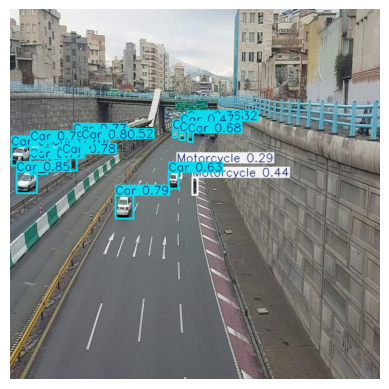

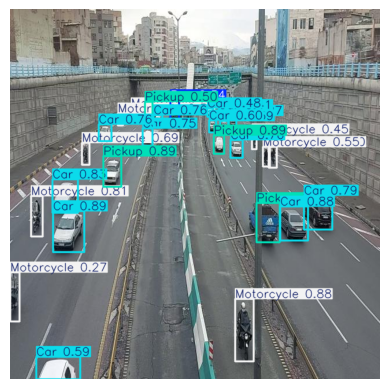

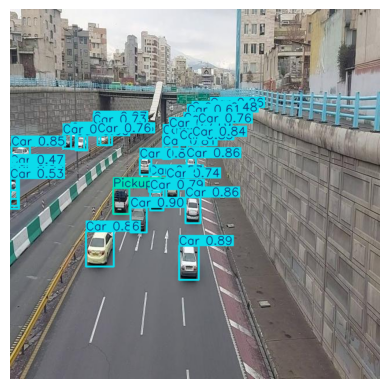

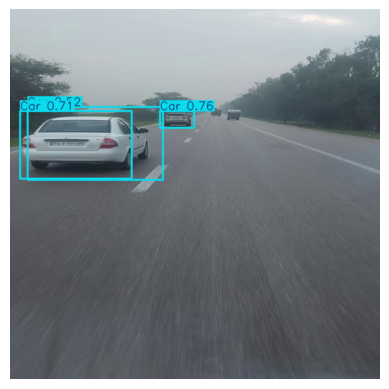

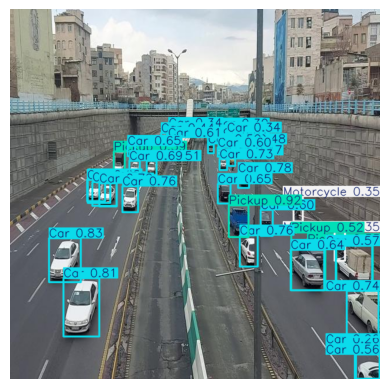

In [23]:
detection_pipeline(test_imgs)


In [25]:
!yolo track model="/kaggle/working/runs/detect/train3/weights/best.pt" source="/kaggle/input/sample/Sample_Video_HighQuality.mp4" 
save=True

requirements: Ultralytics requirement ['lap>=0.5.12'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 0.7s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect

Ultralytics 8.3.168 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs

video 1/1 (frame 1/1001) /kaggle/input/sample/Sample_Video_HighQuality.mp4: 384x640 15 Cars, 2 Motorcycles, 36.1ms
video 1/1 (frame 2/1001) /kaggle/input/sample/Sample_Video_HighQuality.mp4: 384x640 15 Cars, 2 Motorcycles, 6.8ms
video 1/1 (frame 3/1001) /kaggle/input/sample/Sample_Video_HighQuality.mp4: 384x640 15 Cars, 1 Motorcycle, 7.0ms
video 1/1 (frame 4/1001) /kaggle/input/sample/Sample_Video_HighQuality.mp4: 384x640 13 Cars, 1 Motorcycle, 1 Pickup, 6.3ms
video 1/1 (frame 5/1001) /kaggle/input/sample/Sample_Video_HighQuality.mp4: 384x640 14 Cars, 1 Motorcycle, 6.3ms
video 1/1 (frame 6/1001) /kaggle/input/

In [22]:
!ffmpeg -i /kaggle/working/runs/detect/track/Sample_Video_HighQuality.avi -vf fps=15 -s 640x480 -vcodec libx264 output.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [23]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('output.mp4', 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

In [24]:
from IPython.display import HTML, display
html_video = HTML("""
<video controls>
      <source src="%s" type="video/mp4">
      Your browser does not support the video tag.
</video>
""" % data_url)

display(html_video)

In [31]:
import cv2
from ultralytics import YOLO

# Load the YOLOv8 trained model
model = YOLO("/kaggle/working/runs/detect/train3/weights/best.pt")

# Open the video file
cap = cv2.VideoCapture("/kaggle/input/sample/Sample_Video_HighQuality.mp4")

# Vehicle class indices in your dataset
vehicle_classes = [0, 1, 2, 3, 4]  # ['Bus', 'Car', 'Motorcycle', 'Pickup', 'Truck']
vehicle_ids = set()  # to store unique vehicle track IDs

# Get video properties and create a VideoWriter object
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))
out = cv2.VideoWriter("output_with_counts.mp4", cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

# Read frames from the video and process
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Get tracking results for the current frame
    results = model.track(source=frame, persist=True, stream=True)

    for r in results:
        boxes = r.boxes
        if boxes is None:
            continue

        for box in boxes:
            cls_id = int(box.cls[0])
            track_id = int(box.id[0])
            x1, y1, x2, y2 = map(int, box.xyxy[0])

            if cls_id in vehicle_classes:
                vehicle_ids.add(track_id)

                # Draw bounding box
                cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)

                # Label with ID and class
                label = f"ID:{track_id} Class:{cls_id}"
                cv2.putText(frame, label, (x1, y1 - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 2)

    # Draw vehicle count
    cv2.putText(frame, f"Total vehicles: {len(vehicle_ids)}", (20, 40),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)

    # Write the annotated frame to output video
    out.write(frame)

cap.release()
out.release()


0: 384x640 15 Cars, 2 Motorcycles, 9.7ms
Speed: 2.5ms preprocess, 9.7ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Cars, 2 Motorcycles, 9.3ms
Speed: 3.8ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 15 Cars, 1 Motorcycle, 7.3ms
Speed: 3.0ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 13 Cars, 1 Motorcycle, 1 Pickup, 6.9ms
Speed: 2.2ms preprocess, 6.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Cars, 1 Motorcycle, 7.1ms
Speed: 2.1ms preprocess, 7.1ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Cars, 1 Motorcycle, 6.8ms
Speed: 2.2ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Cars, 1 Motorcycle, 6.8ms
Speed: 2.2ms preprocess, 6.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 14 Cars, 1 Motorc

In [32]:
print(f"Total vehicles detected: {len(vehicle_ids)}")

Total vehicles detected: 293


In [33]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('output_with_counts.mp4', 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

In [ ]:
from IPython.display import HTML, display
html_video = HTML("""
<video controls>
      <source src="%s" type="video/mp4">
      Your browser does not support the video tag.
</video>
""" % data_url)

# Step 5: Display the video
display(html_video)